<a href="https://colab.research.google.com/github/pndang/Project_WHEL/blob/main/exploratory_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Author: Phu Dang
# Date: 01.20.2023
# Mentor: Professor Niema Moshiri, Niema Lab

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Importing libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
import seaborn as sns
from pandas.plotting import scatter_matrix
import scipy.stats as stats

In [4]:
cd /content/drive/MyDrive/NIEMA_Lab

/content/drive/MyDrive/NIEMA_Lab


In [5]:
!ls

 carot0.xls		      Health_Status.xls   REPROHX.xls
 countrySubmissionCount.csv   LIFESTYLE.xls	  suppintake.XLS
 covid19variants.csv	      Medical.xls	  TFbase.xls
 demographics.xls	      NDSDIET.xls	 'WHEL Study Summary.gdoc'
 FAMHX.xls		      Nsupps.xls
 ffq0.xls		      phbase.xls


In [6]:
# Loading dataset

# Health Status at baseline
hs = pd.read_excel("Health_Status.xls")

# Demographics
dm = pd.read_excel("demographics.xls")

# Medical/clinic measurements at baseline
me = pd.read_excel("Medical.xls")

# Food from NDS at baseline
fd = pd.read_excel("NDSDIET.xls")

# Supplements intake at baseline
suppf = pd.read_excel("Nsupps.xls")
supp = pd.read_excel("suppintake.XLS")

# Thoughts and feelings at baseline
tf = pd.read_excel("TFbase.xls")

# Personal habits at baseline
ph = pd.read_excel("phbase.xls")

# Lifestyle at baseline
ls = pd.read_excel("LIFESTYLE.xls")

# Family history at baseline
fh = pd.read_excel("FAMHX.xls")

# Reproductive history at baseline
rh = pd.read_excel("REPROHX.xls")

# Food frequency at baseline
ff = pd.read_excel("ffq0.xls")

# Blood carotenoids at baseline
bc = pd.read_excel("carot0.xls")

In [7]:
datasets = {"Health Status": hs, "Demographics": dm, "Medical Measurements": me, 
            "Food from NDS": fd, "Supplements": supp, "Thoughts and Feelings": tf,
            "Personal Habits": ph, "Lifestyle": ls, "Family History": fh, "Reproductive History": rh, 
            "Food Frequency": ff, "Blood Carotenoids": bc}

In [8]:
hs.columns

Index(['ID', 'hospital_', 'Exam_Freq', 'Proph_Mast', 'Blood_Sugar',
       'Cardiovascular', 'Digestive', 'Arthritis', 'Osteoporosis', 'Misc_Cond',
       'Blood_Sugar_Meds', 'Cardio_Meds', 'Gastro_Meds', 'Corticosteroids_'],
      dtype='object')

# Data cleaning, preprocessing & EDA

In [9]:
hs.head(10)

,ID,hospital_,Exam_Freq,Proph_Mast,Blood_Sugar,Cardiovascular,Digestive,Arthritis,Osteoporosis,Misc_Cond,Blood_Sugar_Meds,Cardio_Meds,Gastro_Meds,Corticosteroids_
0,13245,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,13244,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,13243,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,13242,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,13241,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0
5,13240,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,13239,0.0,3.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0
7,13238,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,13237,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
9,13236,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [10]:
x = hs['Cardiovascular']
print(len(x))
x = [i for i in x if not math.isnan(i)]

3088


In [11]:
len(x)

2543

In [12]:
np.unique(x)

array([0., 1.])

In [13]:
cols = [i for i in hs.columns if i not in ['ID', 'hospital_', 'Exam_Freq']]
cols 

['Proph_Mast',
 'Blood_Sugar',
 'Cardiovascular',
 'Digestive',
 'Arthritis',
 'Osteoporosis',
 'Misc_Cond',
 'Blood_Sugar_Meds',
 'Cardio_Meds',
 'Gastro_Meds',
 'Corticosteroids_']

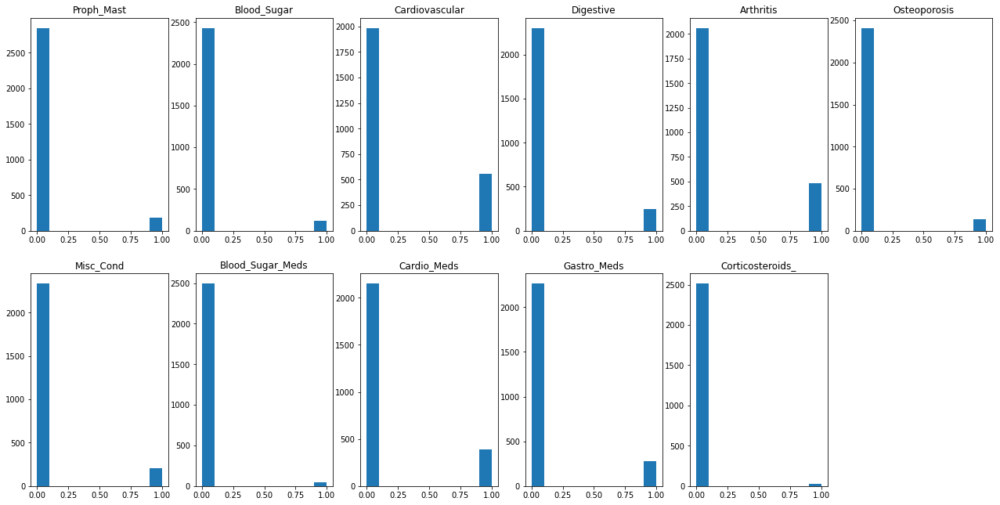

In [14]:
index = 1
plt.figure(figsize=(22, 11))
for col in cols:
  plt.subplot(2, 6, index)
  values = [i for i in hs[col] if not math.isnan(i)]
  plt.hist(values)
  plt.title(col)
  index += 1

In [15]:
hs.sort_values(by='ID', ascending=True)

,ID,hospital_,Exam_Freq,Proph_Mast,Blood_Sugar,Cardiovascular,Digestive,Arthritis,Osteoporosis,Misc_Cond,Blood_Sugar_Meds,Cardio_Meds,Gastro_Meds,Corticosteroids_
3087,1002,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3086,1003,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3085,1005,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3084,1007,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3083,1008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4,13241,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0
3,13242,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,13243,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,13244,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [16]:
tf

,ID,ss_tot,ss_emot,ss_aff,ss_tang,ss_pos,lv_alone,petownr,church,religion,...,symptom,bloat,sweats,aches,hotflash,tired,totlfevt,dep_log,whi_irs_old,WHI_irs_new
0,1002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1003,45,20.0,5.0,10.0,10.0,0.0,1.0,5.0,3.0,...,0.057,0.0,0.0,0.0,0.0,0.0,0.0,0.001438,6.0,1.0
2,1005,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1007,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1008,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3083,13241,36,13.0,5.0,10.0,8.0,1.0,1.0,1.0,3.0,...,0.771,2.0,0.0,1.0,0.0,2.0,1.0,0.001730,11.0,6.0
3084,13242,40,16.0,5.0,9.0,10.0,0.0,1.0,1.0,1.0,...,0.057,0.0,0.0,0.0,1.0,0.0,1.0,0.001730,13.0,8.0
3085,13243,37,14.0,5.0,8.0,10.0,0.0,1.0,1.0,2.0,...,0.457,0.0,2.0,2.0,2.0,2.0,4.0,0.001730,14.0,9.0
3086,13244,38,16.0,4.0,10.0,8.0,0.0,1.0,1.0,2.0,...,0.457,0.0,1.0,1.0,2.0,1.0,1.0,0.001573,13.0,8.0


In [17]:
tf.columns

Index(['ID', 'ss_tot', 'ss_emot', 'ss_aff', 'ss_tang', 'ss_pos', 'lv_alone',
       'petownr', 'church', 'religion', 'club', 'caregvB', 'strain',
       'optimism', 'nee', 'aee', 'hostil', 'QOL', 'physhealth', 'physfctn',
       'lim_phys', 'pain', 'genhlth', 'mental health', 'lim_emot', 'energy',
       'emotwell', 'socfctn', 'symptom', 'bloat', 'sweats', 'aches',
       'hotflash', 'tired', 'totlfevt', 'dep_log', 'whi_irs_old',
       'WHI_irs_new'],
      dtype='object')

In [18]:
for label, dataset in datasets.items():
  print(label)
  print(dataset.columns)
  print()

Health Status
Index(['ID', 'hospital_', 'Exam_Freq', 'Proph_Mast', 'Blood_Sugar',
       'Cardiovascular', 'Digestive', 'Arthritis', 'Osteoporosis', 'Misc_Cond',
       'Blood_Sugar_Meds', 'Cardio_Meds', 'Gastro_Meds', 'Corticosteroids_'],
      dtype='object')

Demographics
Index(['ID', 'age at dx', 'age at rand', 'Ethnicity', 'Education',
       'Marital Status', 'Empl. Status', 'Yr Rand'],
      dtype='object')

Medical Measurements
Index(['ID', 'Lump/Mast', 'Radiation', 'Chemo', 'Tumor Type', 'Estr Recep',
       'Prog Recep', 'Node Exam', 'Node Pos', 'Stage', 'Tumor Size', 'Height',
       'Weight', 'BMI', 'Waist', 'Hip', 'Pulse', 'Bld Pres -Sys',
       'Bld Pres - Dias', 'Menopause', 'Anti-Estr Use', 'Anti-Estro Type'],
      dtype='object')

Food from NDS
Index(['ID', 'Recalls', 'last date', 'Kcal', 'Protein(g', 'Total Fat',
       'Total Carb', 'Alcohol', '% Protein', '% Fat', '% Carb', '% Alcohol',
       'Caffeine', 'Calcium', 'Iron', 'Magnesium', 'Phosphorus', 'Potassium',


### Compare visualizations of biomarkers between hospitalized and not hospitalized patients 
Datasets: thoughts and feelings, lifestyle, family history, reproductive history, blood carotenoids

(Baseline exclusively)

In [19]:
# Merging heath status and blood carotenoids

health_bc = hs.merge(right=bc, how="inner", on="ID")
health_bc.columns
health_bc.shape

(3088, 19)

In [20]:
# Cleaning and preprocessing health_tf (health status and thoughts/feelings merged)

health_bc.dropna(inplace=True)
drop_idx = health_bc[health_bc['hospital_'] == 6.].index
health_bc.drop(index=drop_idx, inplace=True)
health_bc.shape

# for col in hs.columns:
#   if col != 'ID':
    # print(col)
    # print(health_tf[col].unique())
    # print()

health_bc.head(5)

,ID,hospital_,Exam_Freq,Proph_Mast,Blood_Sugar,Cardiovascular,Digestive,Arthritis,Osteoporosis,Misc_Cond,Blood_Sugar_Meds,Cardio_Meds,Gastro_Meds,Corticosteroids_,lutein,cryptox,lycopene,alphacar,betacar
0,13245,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.6005,0.3525,1.2404,0.4816,1.2053
1,13244,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5933,0.1300,0.8081,0.2933,1.2226
2,13243,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1742,0.0539,0.7934,0.0260,0.3695
3,13242,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.4095,0.3676,0.9904,0.1729,0.6072
4,13241,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.3137,0.0691,0.4105,0.0619,0.1912


In [21]:
health_bc.shape

(2498, 19)

In [22]:
# Visualize health_tf

# plt.figure(figsize = (31, 19))
# ax = sns.heatmap(health_tf.corr(), annot = True, fmt = '.2f', linewidth = 0.5)
# props = plt.setp(ax.xaxis.get_majorticklabels(), rotation=45, ha='right', rotation_mode='anchor')
# plt.title('Health Status and Thoughts/Feelings Correlation', size = 15)

In [23]:
# cols = hospitalized_bc.columns
# sns.pairplot(hospitalized_bc[[col for col in cols if col != 'ID']], hue = 'hospital_')

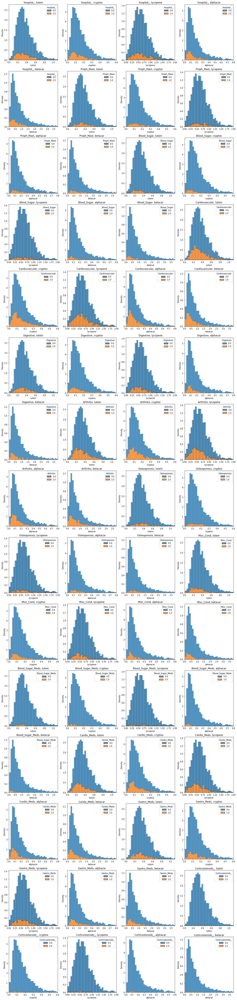

In [24]:
index = 1
plt.figure(figsize=(20, 90)) # sharey=False
for condition in hs.columns:
  if condition not in ['ID', 'Exam_Freq']:
    for col in bc.columns:
      if col != 'ID':
        if col == 'lutein':
          x = 1.1
        elif col == 'cryptox':
          x = 0.6
        elif col == 'alphacar':
          x = 0.8
        elif col == 'betacar':
          x = 3.8
        else:
          x = 2
        plt.subplot(15, 4, index)
        sns.histplot(health_bc, x=col, hue=condition, multiple='stack', stat='density', common_norm=True);
        plt.xlim(0, x)
        plt.title(f"{condition}, {col}")
        index += 1


In [25]:
# Merging thoughts/feelings and lifestyle

tfls = tf.merge(right=ls, how="inner", on="ID")
tfls.columns
tfls.shape

(3088, 67)

In [26]:
tfls.dropna(inplace=True)
tfls.shape

(2086, 67)

In [27]:
tfls.columns

Index(['ID', 'ss_tot', 'ss_emot', 'ss_aff', 'ss_tang', 'ss_pos', 'lv_alone',
       'petownr', 'church', 'religion', 'club', 'caregvB', 'strain',
       'optimism', 'nee', 'aee', 'hostil', 'QOL', 'physhealth', 'physfctn',
       'lim_phys', 'pain', 'genhlth', 'mental health', 'lim_emot', 'energy',
       'emotwell', 'socfctn', 'symptom', 'bloat', 'sweats', 'aches',
       'hotflash', 'tired', 'totlfevt', 'dep_log', 'whi_irs_old',
       'WHI_irs_new', 'main meals', 'snacks', 'meals out', 'cooking time',
       'adults', 'children', 'I cook?', 'cooking help', 'I clean up?',
       'cleanup help', 'shopping freq', 'grocery bill', 'I buy food?',
       'shopping help', 'weight', 'time at weight', 'pre-BC weight',
       'age18 weight', 'max weight', 'time at max wgt', 'health insurance',
       'insurance change?', 'insurance satisfaction', 'years in state',
       'where born', 'age15 residence', 'age35 residence', 'age50 residence',
       'longest residence'],
      dtype='object')

In [28]:
# tfls.rename(columns={'ss_tot':'total'})

In [29]:
tfls = tfls[tfls['longest residence'] != ' '] 

In [30]:
# Convert string-type columns in tfls to floats

# for col in tfls.columns:
#   if not isinstance(list(tfls[col])[0], float):
#     for x in list(tfls[col]):
#       if isinstance(x, str):
#         print(col)
#         print(f"{x} +{x}+++ {len(x)}")
#       new_x = np.float64(x)

tfls = tfls.astype(float)

In [31]:
tfls.QOL

7       85.062500
10      74.957031
18      79.019531
19      68.062500
22      89.062500
          ...    
3080    93.125000
3082    93.187500
3083    77.269531
3084    92.875000
3086    73.062500
Name: QOL, Length: 2083, dtype: float64

Text(0.5, 1.0, 'Thoughts/Feelings and Lifestyle Correlation')

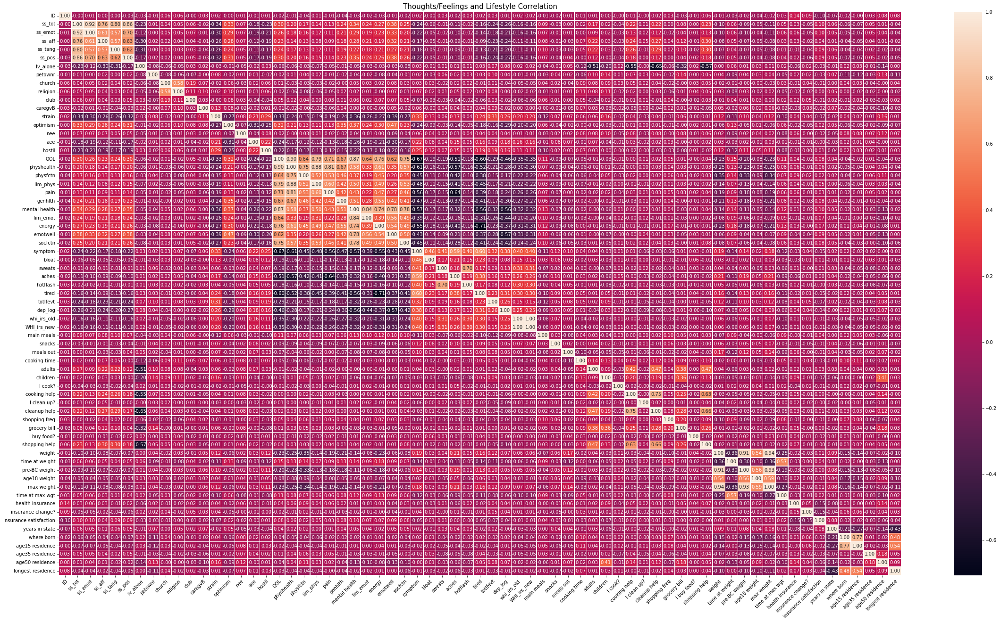

In [32]:
# Visualize tfls

plt.figure(figsize = (40, 22))
ax = sns.heatmap(tfls.corr(), annot = True, fmt = '.2f', linewidth = 0.5)
props = plt.setp(ax.xaxis.get_majorticklabels(), rotation=45, ha='right', rotation_mode='anchor')
plt.title('Thoughts/Feelings and Lifestyle Correlation', size = 15)

Text(0.5, 1.0, 'Thoughts and Feelings Correlation')

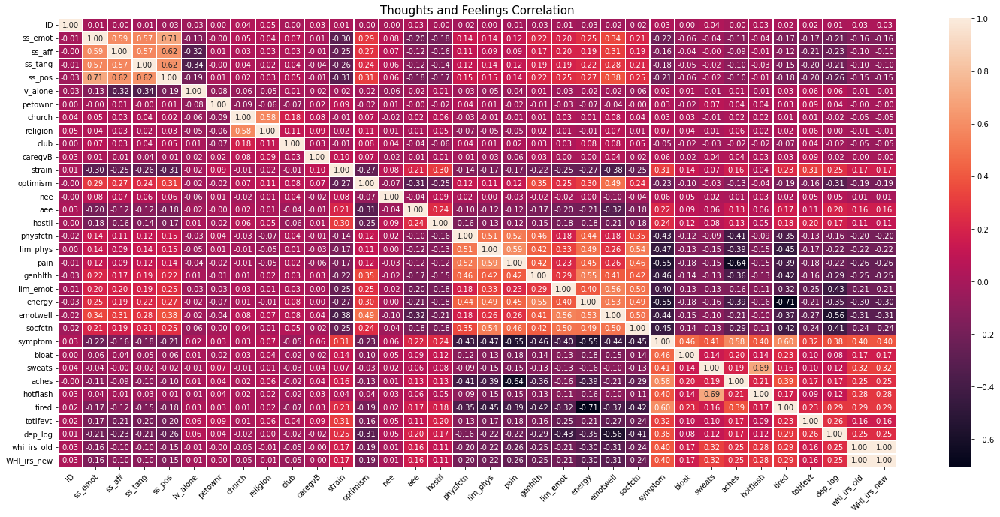

In [33]:
# Visualize tf

plt.figure(figsize = (25, 11))
ax = sns.heatmap(tf.corr(), annot = True, fmt = '.2f', linewidth = 0.5)
props = plt.setp(ax.xaxis.get_majorticklabels(), rotation=45, ha='right', rotation_mode='anchor')
plt.title('Thoughts and Feelings Correlation', size = 15)

Text(0.5, 1.0, 'Lifestyle Correlation')

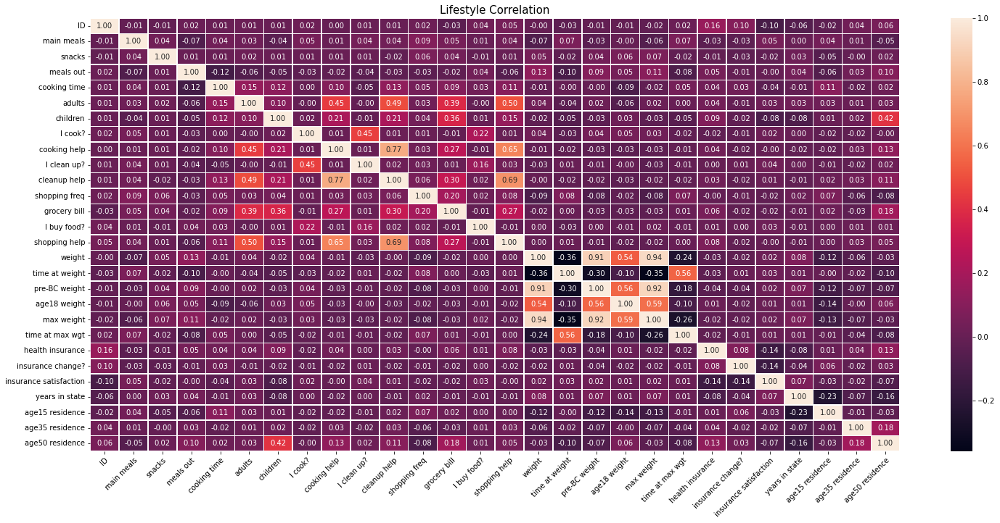

In [34]:
# Visualize ls

plt.figure(figsize = (25, 11))
ax = sns.heatmap(ls.corr(), annot = True, fmt = '.2f', linewidth = 0.5)
props = plt.setp(ax.xaxis.get_majorticklabels(), rotation=45, ha='right', rotation_mode='anchor')
plt.title('Lifestyle Correlation', size = 15)

In [35]:
tfls['lv_alone'].unique()

array([0., 1.])

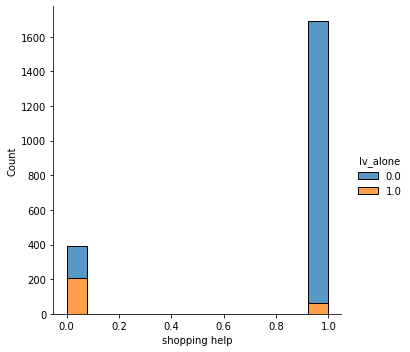

In [36]:
sns.displot(data=tfls, x='shopping help', hue='lv_alone', multiple='stack')

In [37]:
# Check for columns with <= 10 unique values to plot histograms with comparable conditional subsets

columns = []
for col in tfls.columns:
  if col != 'ID':
    length = len(tfls[col].unique())
    if length <= 10:
      columns.append(col)
      print(col)
      print(tfls[col].unique())
      print()

ss_aff
[5. 3. 4. 2. 1.]

ss_tang
[10.  9.  2.  4.  7.  8.  5.  6.  3.]

ss_pos
[ 9.  6. 10.  7.  8.  4.  5.  2.  3.]

lv_alone
[0. 1.]

petownr
[1. 0.]

church
[1. 2. 4. 3. 5. 6.]

religion
[2. 3. 1.]

club
[1. 3. 2. 5. 4. 6.]

caregvB
[0. 1. 4. 3. 2.]

lim_phys
[ 25.       100.         0.        50.        75.        33.328125
  66.65625 ]

pain
[ 87.5  75.   62.5  50.    0.  100.   37.5  25.   12.5]

lim_emot
[100.        66.65625   33.328125   0.      ]

socfctn
[100.   75.   87.5  62.5  37.5  50.   12.5  25.    0. ]

bloat
[0. 1. 2. 3.]

sweats
[0. 1. 3. 2.]

aches
[1. 3. 2. 0.]

hotflash
[1. 3. 0. 2.]

tired
[1. 2. 0. 3.]

totlfevt
[0. 4. 1. 2. 5. 3. 7. 6. 8.]

adults
[3. 2. 1. 4. 6. 5. 7.]

children
[ 2.  1.  0.  3. 12.  4.  5.  6.]

I cook?
[1. 0.]

cooking help
[1. 0.]

I clean up?
[1. 0.]

cleanup help
[1. 0.]

shopping freq
[3. 2. 1. 4.]

I buy food?
[1. 0.]

shopping help
[1. 0.]

health insurance
[5. 4. 1. 3. 7. 6. 8. 2.]

insurance change?
[1. 4. 5. 2. 3. 7. 6.]

insurance

In [38]:
len(columns)

32

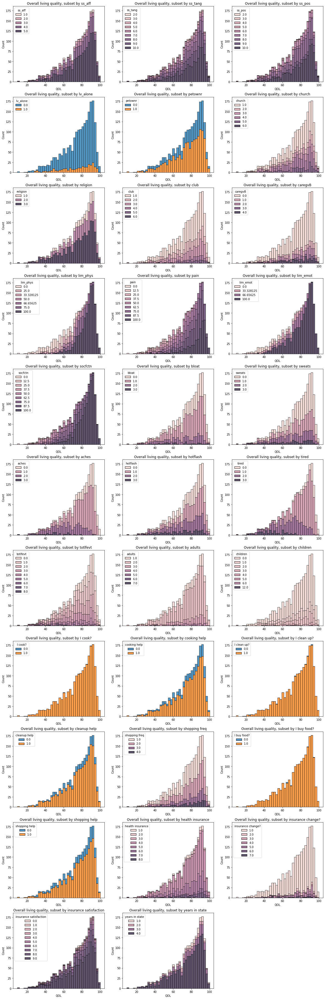

In [39]:
# Plotting the above

index = 1
plt.figure(figsize=(20, 65))
for col in columns:
  plt.subplot(11, 3, index)
  sns.histplot(x=tfls['QOL'], hue=tfls[col], multiple='stack', bins=40)
  plt.title(f"Overall living quality, subset by {col}")
  index += 1

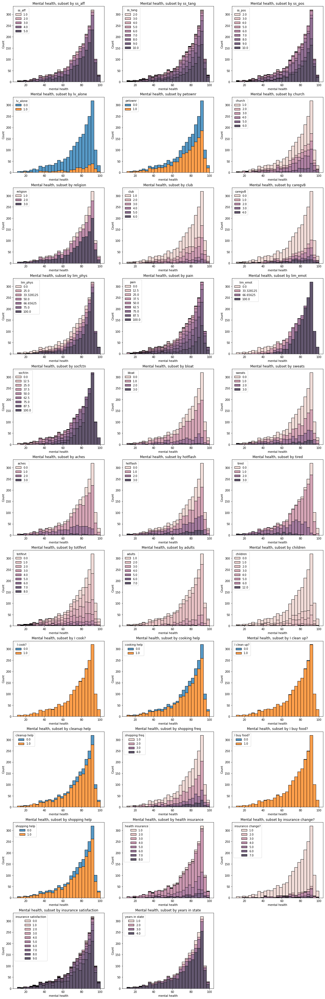

In [40]:
# Plotting the above for general health

index = 1
plt.figure(figsize=(20, 65))
for col in columns:
  plt.subplot(11, 3, index)
  sns.histplot(x=tfls['mental health'], hue=tfls[col], multiple='stack')
  plt.title(f"Mental health, subset by {col}")
  index += 1

In [41]:
# Get columns not plotted above

scatter_columns = []
for col in tfls.columns: 
  if col not in ['ID'] and col not in columns:
    scatter_columns.append(col)
len(scatter_columns)

34

In [42]:
columns

['ss_aff',
 'ss_tang',
 'ss_pos',
 'lv_alone',
 'petownr',
 'church',
 'religion',
 'club',
 'caregvB',
 'lim_phys',
 'pain',
 'lim_emot',
 'socfctn',
 'bloat',
 'sweats',
 'aches',
 'hotflash',
 'tired',
 'totlfevt',
 'adults',
 'children',
 'I cook?',
 'cooking help',
 'I clean up?',
 'cleanup help',
 'shopping freq',
 'I buy food?',
 'shopping help',
 'health insurance',
 'insurance change?',
 'insurance satisfaction',
 'years in state']

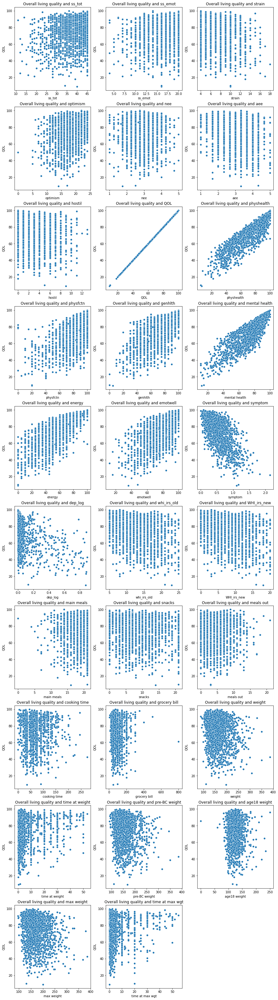

In [43]:
# Plotting the above

index = 1
plt.figure(figsize=(15, 70))
for col in scatter_columns[:-5]:
  plt.subplot(12, 3, index)
  sns.scatterplot(data=tfls, x=col, y='QOL')
  plt.title(f"Overall living quality and {col}")
  index += 1
  

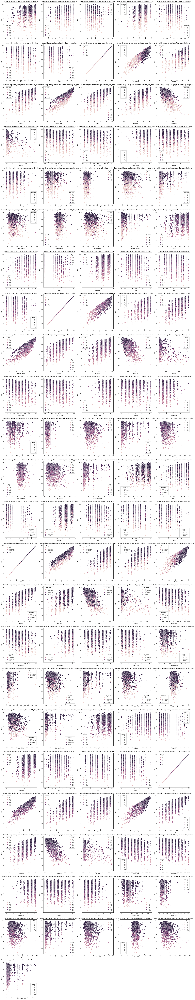

In [44]:
# Plotting the above, subset by variables in [columns]

subsets = ['lim_phys', 'pain', 'lim_emot', 'socfctn']
index = 1
plt.figure(figsize=(30, 200))
for subset in subsets:
  for col in scatter_columns[:-5]:
    plt.subplot(29, 5, index)
    sns.scatterplot(data=tfls, x=col, y='QOL', hue=subset)
    plt.title(f"Overall living quality and {col}, subset by {subset}")
    index += 1

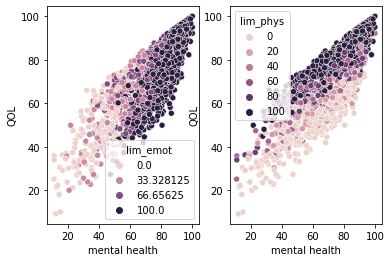

In [45]:
plt.subplot(1, 2, 1)
sns.scatterplot(data=tfls, x='mental health', y='QOL', hue='lim_emot')

plt.subplot(1, 2, 2)
sns.scatterplot(data=tfls, x='mental health', y='QOL', hue='lim_phys')

In [46]:
scatter_columns

['ss_tot',
 'ss_emot',
 'strain',
 'optimism',
 'nee',
 'aee',
 'hostil',
 'QOL',
 'physhealth',
 'physfctn',
 'genhlth',
 'mental health',
 'energy',
 'emotwell',
 'symptom',
 'dep_log',
 'whi_irs_old',
 'WHI_irs_new',
 'main meals',
 'snacks',
 'meals out',
 'cooking time',
 'grocery bill',
 'weight',
 'time at weight',
 'pre-BC weight',
 'age18 weight',
 'max weight',
 'time at max wgt',
 'where born',
 'age15 residence',
 'age35 residence',
 'age50 residence',
 'longest residence']

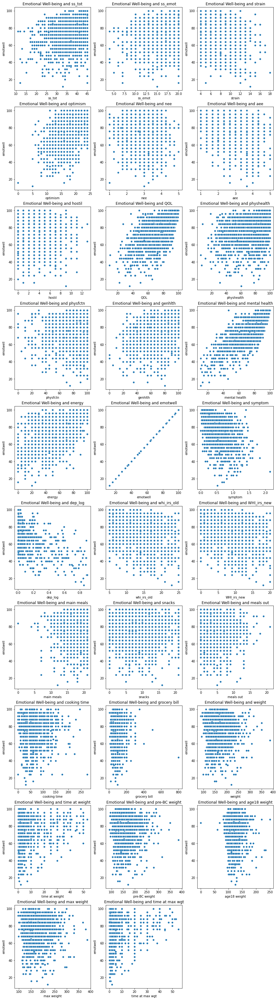

In [47]:
# Plotting general health and other vars in scatter_columns

index = 1
plt.figure(figsize=(15, 70))
for col in scatter_columns[:-5]:
  plt.subplot(12, 3, index)
  sns.scatterplot(data=tfls, x=col, y='emotwell')
  plt.title(f"Emotional Well-being and {col}")
  index += 1

In [48]:
tfls.columns

Index(['ID', 'ss_tot', 'ss_emot', 'ss_aff', 'ss_tang', 'ss_pos', 'lv_alone',
       'petownr', 'church', 'religion', 'club', 'caregvB', 'strain',
       'optimism', 'nee', 'aee', 'hostil', 'QOL', 'physhealth', 'physfctn',
       'lim_phys', 'pain', 'genhlth', 'mental health', 'lim_emot', 'energy',
       'emotwell', 'socfctn', 'symptom', 'bloat', 'sweats', 'aches',
       'hotflash', 'tired', 'totlfevt', 'dep_log', 'whi_irs_old',
       'WHI_irs_new', 'main meals', 'snacks', 'meals out', 'cooking time',
       'adults', 'children', 'I cook?', 'cooking help', 'I clean up?',
       'cleanup help', 'shopping freq', 'grocery bill', 'I buy food?',
       'shopping help', 'weight', 'time at weight', 'pre-BC weight',
       'age18 weight', 'max weight', 'time at max wgt', 'health insurance',
       'insurance change?', 'insurance satisfaction', 'years in state',
       'where born', 'age15 residence', 'age35 residence', 'age50 residence',
       'longest residence'],
      dtype='object')

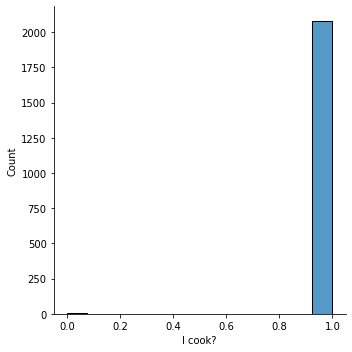

In [49]:
sns.displot(x=tfls['I cook?'])

In [50]:
corr = tfls.corr().columns

In [51]:
og = tfls.columns

In [52]:
for x in og:
  if x not in corr:
    print(x)

In [53]:
stats.pearsonr(tfls['tired'], tfls['energy'])

(-0.7069727541123129, 2.20132507e-315)

### Cleaning data and visualizing relationships between biomarkers and demographics
(marital status and employment status)

In [57]:
dm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3088 entries, 0 to 3087
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   ID              3088 non-null   int64
 1   age at dx       3088 non-null   int64
 2   age at rand     3088 non-null   int64
 3   Ethnicity       3088 non-null   int64
 4   Education       3088 non-null   int64
 5   Marital Status  3088 non-null   int64
 6   Empl. Status    3088 non-null   int64
 7   Yr Rand         3088 non-null   int64
dtypes: int64(8)
memory usage: 193.1 KB


In [59]:
print(dm['Marital Status'].unique())
print(dm['Empl. Status'].unique())

[2 4 5 1 3 6]
[1 0 2]


In [62]:
# Merging thoughts/feelings and demographics [dm]

tfdm = tf.merge(right=dm, how='inner', on='ID')
tfdm.head()
tfdm.shape

(3088, 45)

In [64]:
tfdm.dropna(inplace=True)

In [75]:
tfdm.shape

(2861, 45)

In [89]:
# Remove rows with unknown marital status and/or unknown employment status

tfdm = tfdm[(tfdm['Marital Status'] != 6) & (tfdm['Empl. Status'] != 2)]

In [91]:
tfdm['Empl. Status'].unique()

array([1, 0])

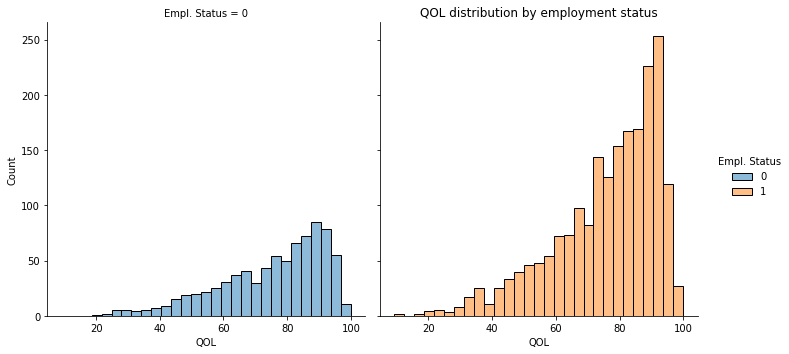

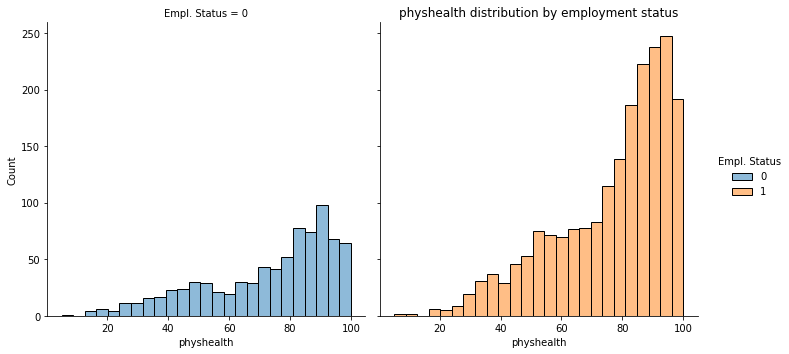

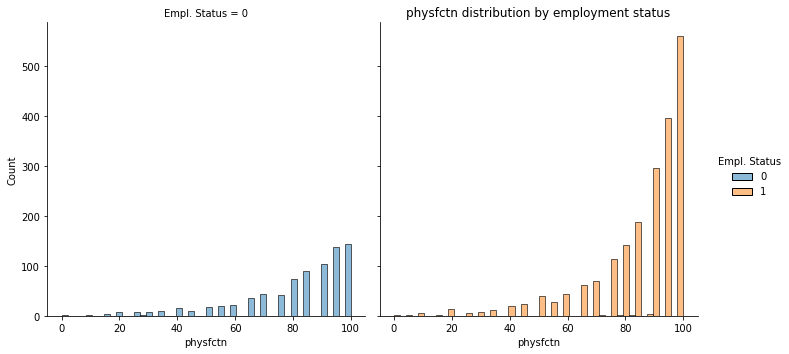

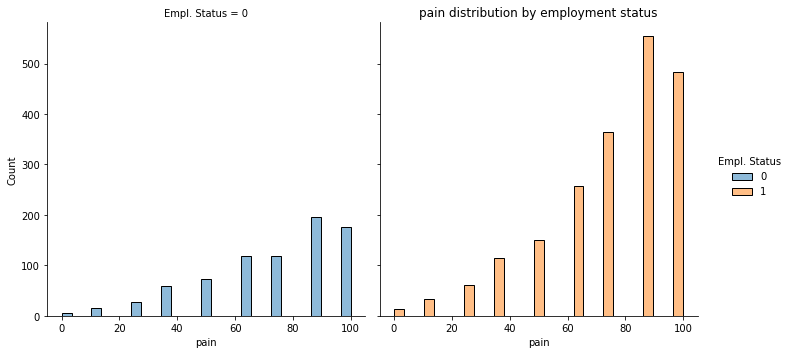

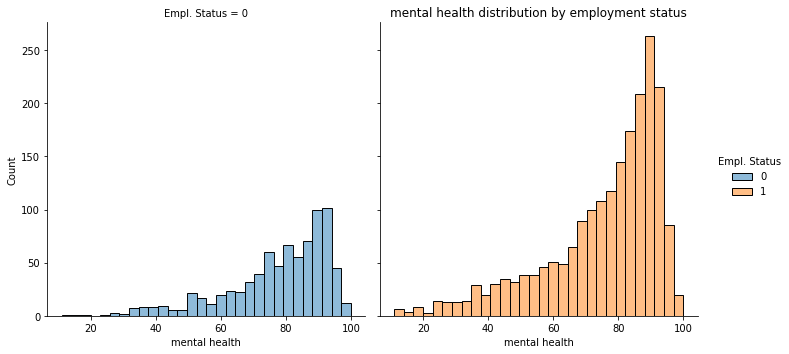

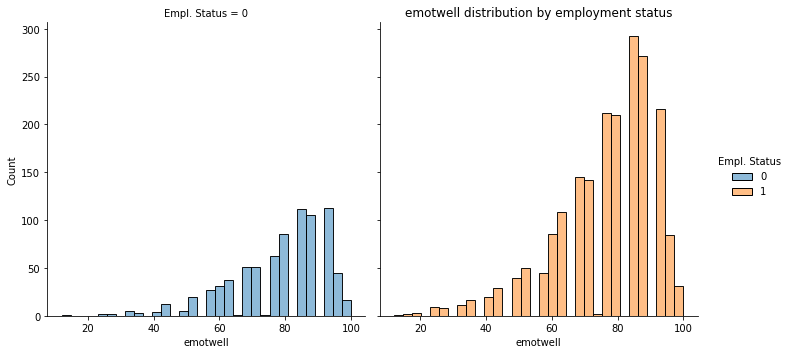

In [107]:
# Visualize thoughts/feelings subsetted by employment status

columns = ['QOL', 'physhealth', 'physfctn', 'pain', 'mental health', 'emotwell']

for col in columns:
  sns.displot(data=tfdm, x=col, hue='Empl. Status', col='Empl. Status',)
  plt.title(f"{col} distribution by employment status")

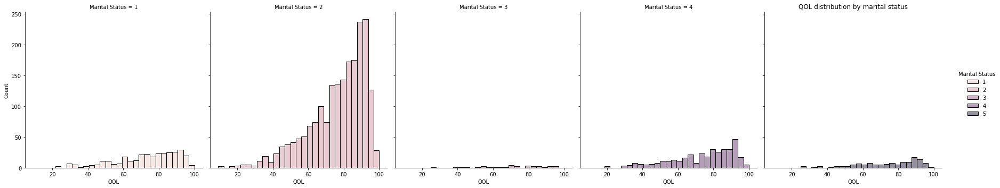

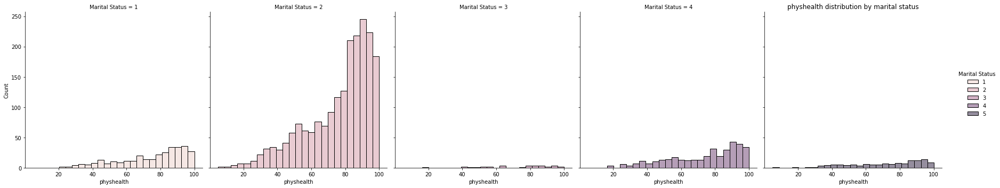

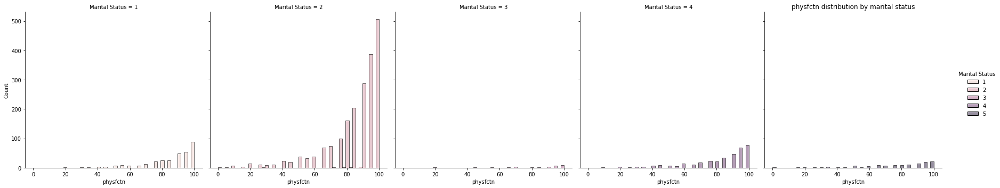

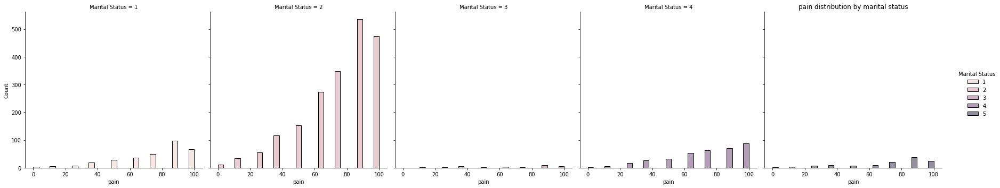

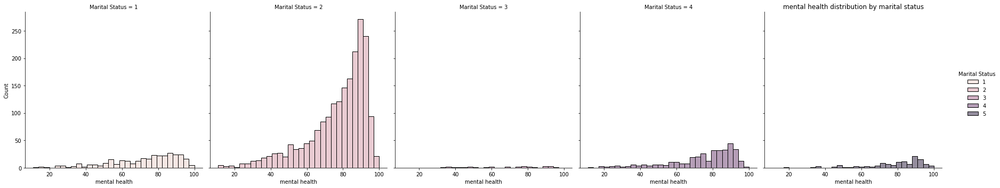

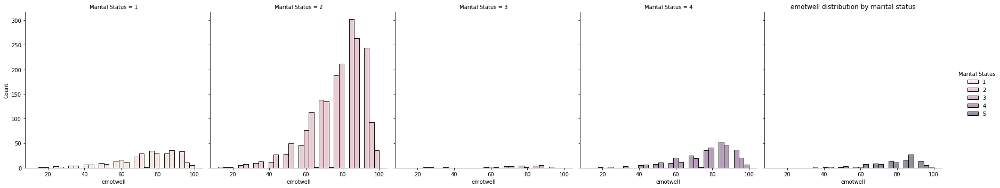

In [110]:
# Above, subsetted by marital status

# Marital Status
# 		1 Single
# 		2 Married
# 		3 Separated
# 		4 Divorced
# 		5 Widowed

for col in columns:
  sns.displot(data=tfdm, x=col, hue='Marital Status', col='Marital Status',);
  plt.title(f"{col} distribution by marital status")

In [144]:
tfdm['ss_pos'].unique()

array([10.,  9.,  8.,  7.,  6.,  4.,  5.,  2.,  3.])

In [121]:
tfdm = tfdm.astype(float)

In [122]:
type(list(tfdm['ID'])[0])

float

Text(0.5, 1.0, 'Positive Interactions and Quality of Living, split by employment status')

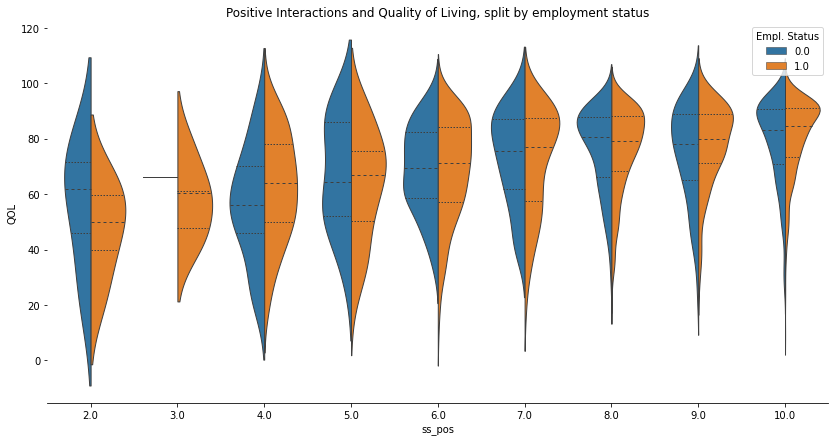

In [148]:
# Plot violinplot between living alone and overall living quality, split by employment status

plt.figure(figsize=(14, 7))
sns.violinplot(data=tfdm, x='ss_pos', y='QOL', hue='Empl. Status', split=True, 
               inner='quart', linewidth=1)
sns.despine(left=True)
plt.title(f"Positive Interactions and Quality of Living, split by employment status")

In [93]:
tfdm.columns

Index(['ID', 'ss_tot', 'ss_emot', 'ss_aff', 'ss_tang', 'ss_pos', 'lv_alone',
       'petownr', 'church', 'religion', 'club', 'caregvB', 'strain',
       'optimism', 'nee', 'aee', 'hostil', 'QOL', 'physhealth', 'physfctn',
       'lim_phys', 'pain', 'genhlth', 'mental health', 'lim_emot', 'energy',
       'emotwell', 'socfctn', 'symptom', 'bloat', 'sweats', 'aches',
       'hotflash', 'tired', 'totlfevt', 'dep_log', 'whi_irs_old',
       'WHI_irs_new', 'age at dx', 'age at rand', 'Ethnicity', 'Education',
       'Marital Status', 'Empl. Status', 'Yr Rand'],
      dtype='object')